In [20]:
!pip install imagecodecs
!pip install opencv-python
from google.colab import drive
drive.mount('/content/drive')
import cv2
import numpy as np
import os
import tifffile as tiff
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import cv2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [21]:
def stretch_histogram(image):
  # Calculate the minimum and maximum pixel values of the image
  min_val = np.min(image)
  max_val = np.max(image)

  # Perform histogram stretching
  stretched_image = np.uint8((image - min_val) * 255.0 / (max_val - min_val))

  return stretched_image


In [22]:
def increase_contrast(image):
  # Apply histogram equalization
  equalized_image = cv2.equalizeHist(image)

  return equalized_image

In [94]:
def track_motion(directory_real_img,directory_real_mask,directory):

  files = os.listdir(directory)
  files.sort()  # Sort files by name

  prev_frame = tiff.imread(os.path.join(directory, files[1]))  # Replace with your own image file path
  # Remove the last channel
  prev_frame = prev_frame[:, :, :-1]


  # Convert the first image to grayscale
  prev_frame = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

  # Define some parameters for the Farneback's algorithm
  pyr_scale = 0.5
  levels = 3
  winsize = 15
  iterations = 3
  poly_n = 5
  poly_sigma = 1.1

  # Loop through the rest of the images to track motion
  for i in range(2, len(files)):
    if files[i].lower().endswith(".tif"):
      curr_frame = tiff.imread(os.path.join(directory, files[i]))  # Replace with your own image file path
      # Remove the last channel
      curr_frame = curr_frame[:, :, :-1]

      real_unet_result = curr_frame.copy()
      # Convert the current image to grayscale
      curr_frame = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)

      # Compute dense optical flow using Gunnar Farneback's algorithm
      flow = cv2.calcOpticalFlowFarneback(
          prev_frame, curr_frame, None, pyr_scale, levels, winsize, iterations, poly_n, poly_sigma,0
      )

      # Visualize the optical flow (optional - you can omit this step)
      # Split the string using the underscore "_" as the delimiter
      parts = files[i].split("_")

      # Extract the first part of the split string, which should be the number
      first_number = parts[0]
      real_img = tiff.imread(directory_real_img+first_number+'_4bands.tif')
      real_img = real_img[:, :, :-1]
      real_img = (real_img * 255).astype(np.uint8)

      mask = tiff.imread(directory_real_mask+first_number+'_dqf.tif')

      mask[mask==2]=255

      visualize_optical_flow(curr_frame, flow, real_img, real_unet_result,mask,i)

      # Update the previous frame with the current frame for the next iteration
      prev_frame = curr_frame

def visualize_optical_flow(frame, flow, real_img, real_unet_result,mask,number):
  # Compute the magnitude and angle of the flow vectors
  magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

  # Set the visual representation of the flow field
  hsv = np.zeros((frame.shape[0], frame.shape[1], 3), dtype=np.uint8)
  hsv[..., 1] = 255
  hsv[..., 0] = angle * 180 / np.pi / 2
  hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

  # Convert the HSV image to BGR (RGB) for visualization
  bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
  bgr = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

  # Create a figure and three subplots side by side
  fig, axes = plt.subplots(1, 4, figsize=(15, 5))

  # Plot the first image on the first subplot
  axes[0].imshow(increase_contrast(bgr), cmap='gray')  # Use 'gray' cmap if the images are grayscale
  axes[0].set_title('Gunnar algorithm')
  real_unet_result = cv2.cvtColor(real_unet_result, cv2.COLOR_BGR2RGB)
  # Plot the second image on the second subplot
  axes[1].imshow(real_unet_result)
  axes[1].set_title('Unet')

  # Plot the third image on the third subplot
  axes[2].imshow(mask,cmap='gray')
  axes[2].set_title('Ground_truth')

  # Plot the third image on the third subplot
  axes[3].imshow(real_img)
  axes[3].set_title('Real image')

  # Adjust spacing between subplots for better visualization
  plt.tight_layout()

  # Save the figure to your drive
  output_file_path = "/content/drive/MyDrive/optic_flow_final_dataset/output_optic_flow_Gunner/image"+str(number)+".png"  # Replace with your desired file path
  plt.savefig(output_file_path)

  # Display the figure with all three images side by side
  plt.show()


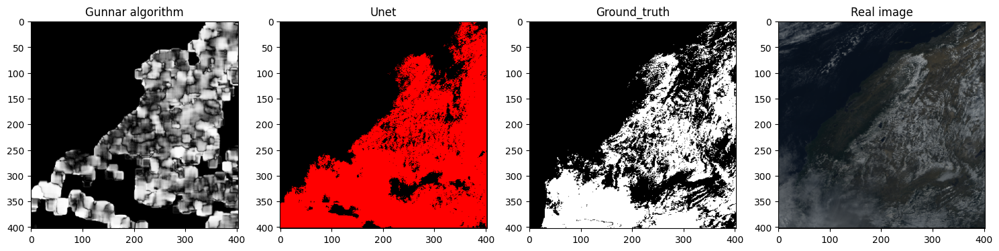

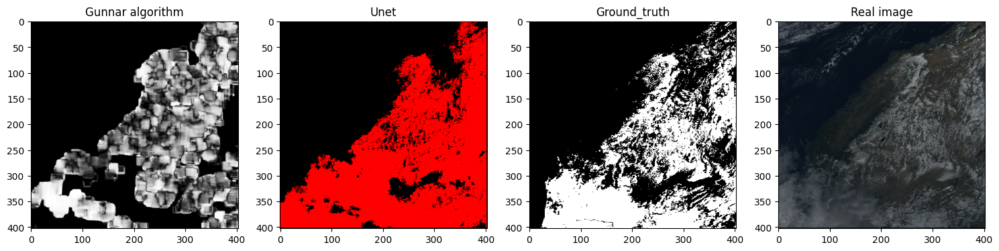

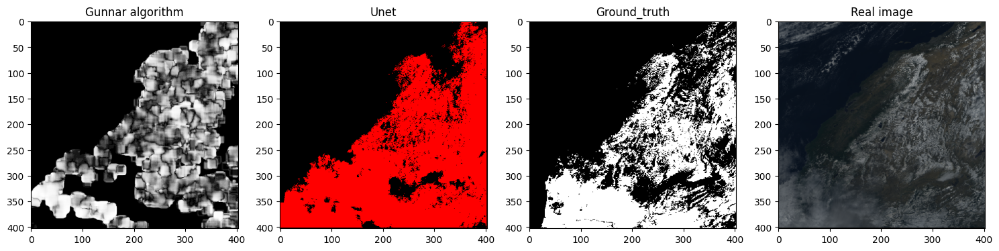

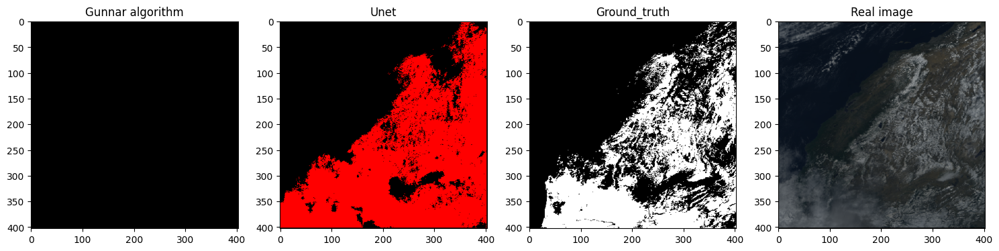

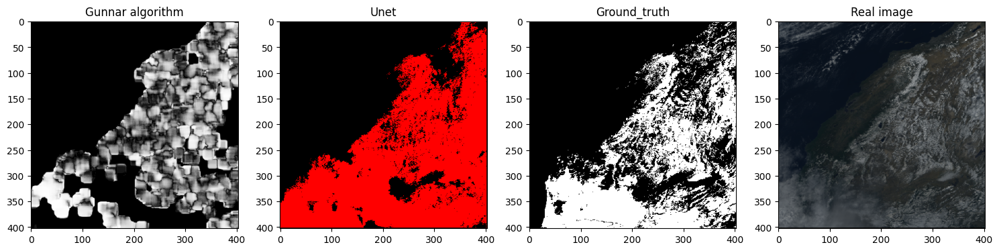

...

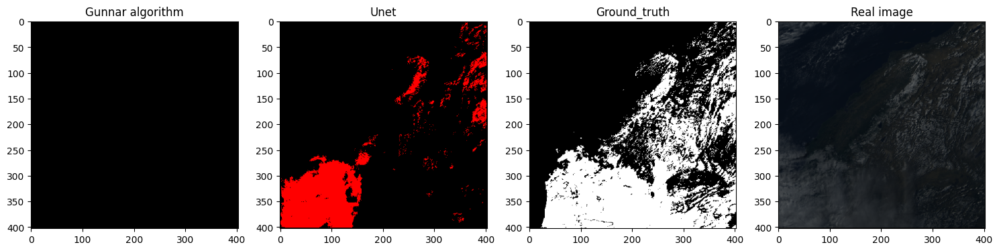

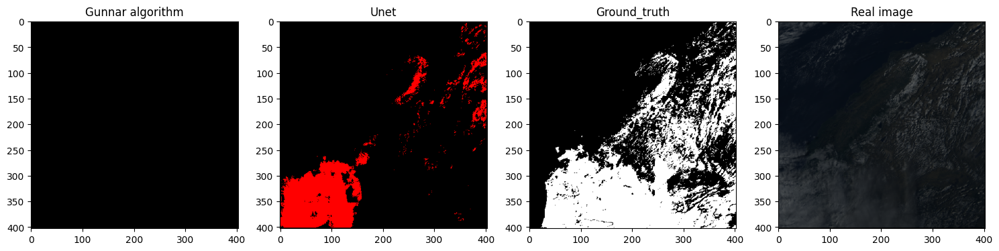

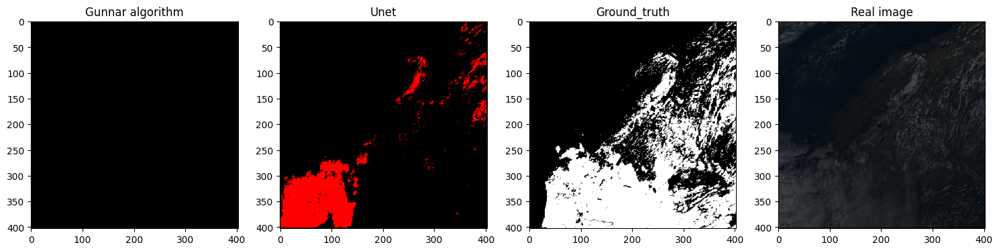

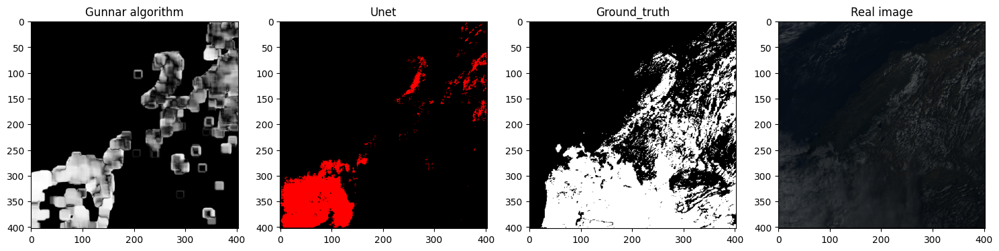

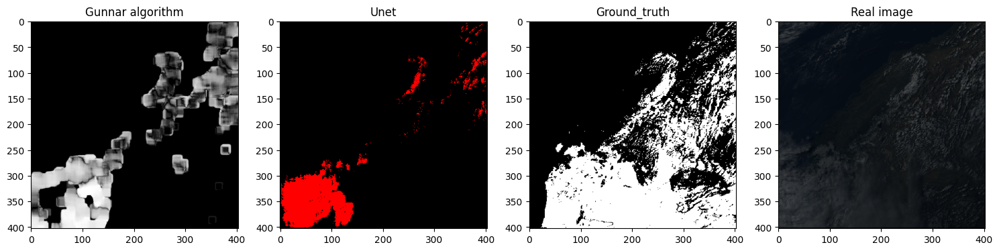

In [95]:
# Call the track_motion function to compute and visualize the optical flow
track_motion('/content/drive/MyDrive/optic_flow_final_dataset/dataset_optic_flow_img/','/content/drive/MyDrive/optic_flow_final_dataset/dataset_optic_flow_mask/','/content/drive/MyDrive/optic_flow_final_dataset/unet_results')
